In [1]:
import pandas as pd
import numpy as np

from tqdm import tqdm

from pathlib import Path
import os
import h5py

import matplotlib.pyplot as plt
import seaborn as sns

import kornia
import kornia.feature as KF

import torch

import cv2

import itertools
from typing import Any, List, Tuple

from src.styles import set_styles, TXT_ACC, TXT_RESET, PALETTE
from src.image_pairs import get_image_pairs

SEED=42

import warnings
warnings.filterwarnings('ignore')

set_styles()

In [2]:
class CFG:
    dir_train = 'data\\train'
    path_target = 'data\\train\\train_labels.csv'

In [3]:
def pad_image_to_size(image, target_height, target_width):
    # Get the current image dimensions
    height, width = image.shape[:2]

    # Compute the amount of padding needed
    pad_height = max(0, target_height - height)
    pad_width = max(0, target_width - width)

    # Compute padding tuples
    top_pad = (0, pad_height)
    left_pad = (0, pad_width)

    # Pad the image with zeros
    padded_image = np.pad(image, ((top_pad), (left_pad), (0, 0)), mode='constant')

    return padded_image



def display_matched_keypoints(img_path1: Path, 
                              img_path2: Path, 
                              feature_dir: Path, 
                              distance: float):
    image1 = plt.imread(img_path1)
    image2 = plt.imread(img_path2)

    w = max(image1.shape[1], image2.shape[1])
    h = max(image1.shape[0], image2.shape[0])

    image1 = pad_image_to_size(image1, h, w)
    image2 = pad_image_to_size(image2, h, w)


    # Create a new image to visualize the matches
    matches_image = np.hstack((image1 / 2 + 0.5, image2.copy() / 2 + 0.5))

    with h5py.File(feature_dir / 'keypoints.h5', mode='r') as f_keypoints:
        keypoints1 = torch.from_numpy(f_keypoints[img_path1.name][...]).detach().cpu().numpy()    
        keypoints2 = torch.from_numpy(f_keypoints[img_path2.name][...]).detach().cpu().numpy()

    with h5py.File(feature_dir / 'matches.h5', mode='r') as f_matches:
        if img_path1.name in f_matches.keys() and img_path2.name in f_matches[img_path1.name].keys():
            match_pairs = f_matches[img_path1.name][img_path2.name][...]
        else: return

    # Display the matches image
    _, ax = plt.subplots(ncols=1, nrows=1, figsize=(12,8))
    ax.imshow(matches_image)  
    sns.scatterplot(x=keypoints1[:, 0], y=keypoints1[:, 1], color="red", size=1, alpha=0.5, ax=ax)
    sns.scatterplot(x=keypoints2[:, 0]+w, y=keypoints2[:, 1], color="purple", size=1, alpha=0.5, ax=ax)

    n_colors = len(PALETTE)
    for i, (idx1, idx2) in enumerate(match_pairs[::10]):
        xs = [keypoints1[idx1][0], keypoints2[idx2][0]+w]    
        ys = [keypoints1[idx1][1], keypoints2[idx2][1]]
        sns.lineplot(x=xs, y=ys, ax=ax, color=PALETTE[i % n_colors], alpha=0.9)

    plt.title(f'{img_path1.name}\n{img_path2.name}\n{distance}')
    plt.tight_layout()
    plt.show();



def get_closest_n_images(index0, index_pairs, num_best):
    indice2 = [(p[1], p[2]) for p in index_pairs if p[0] == index0]
    indice2.extend([(p[0], p[2]) for p in index_pairs if p[1] == index0])
    indice2.sort(key=lambda x: x[1])
    return indice2[:num_best]


def display_dataset_best_matched_keypoints(dataset, index_image, num_pairs):
    print(f'{TXT_ACC} {dataset} {TXT_RESET}')
    dir_images = f'{CFG.dir_train}/{dataset}/images/'
    files = os.listdir(dir_images)
    image_names = [file for file in files if file.endswith('.png')]
    image_paths = [Path(os.path.join(dir_images, file)) for file in image_names]
    dir_features = Path(os.path.join(CFG.dir_train, dataset, 'features'))

    with h5py.File(dir_features / 'embeddings_dinov2_base.h5', mode='r') as f_embeddings:
        embeddings = [f_embeddings[key][:] for key in f_embeddings.keys()]

    index_pairs = get_image_pairs(embeddings)
    best_pairs = get_closest_n_images(index_image, index_pairs, num_pairs)

    for idx, dst in best_pairs:
        if index_image < idx:
            display_matched_keypoints(image_paths[index_image], image_paths[idx], dir_features, dst)
        else:
            display_matched_keypoints(image_paths[idx], image_paths[index_image], dir_features, dst)


 church 


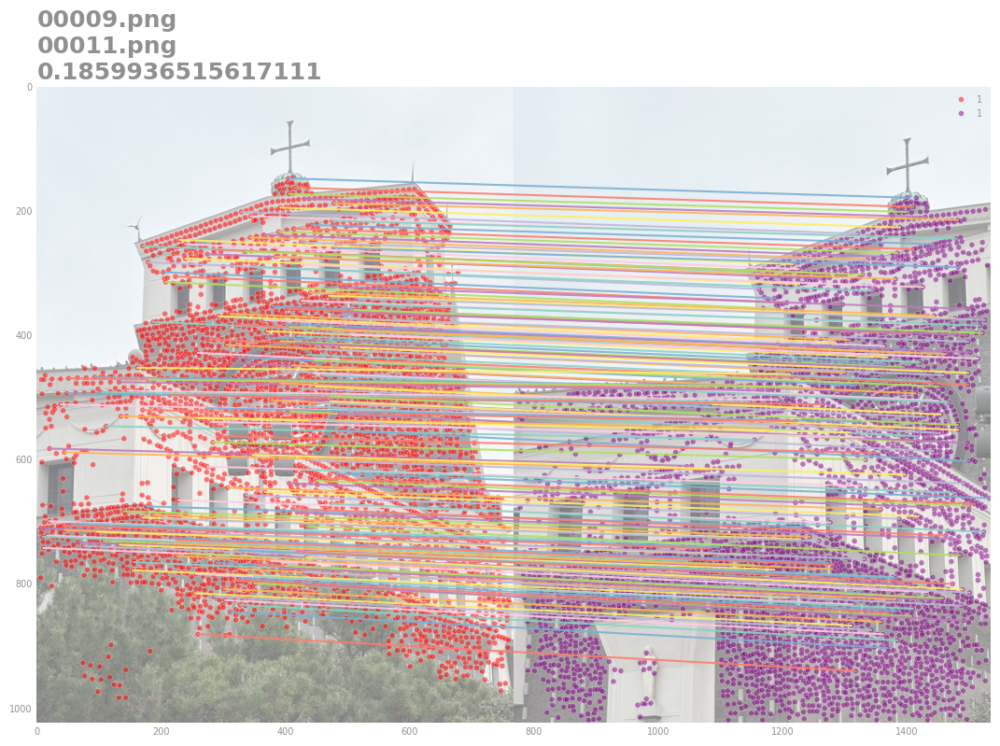

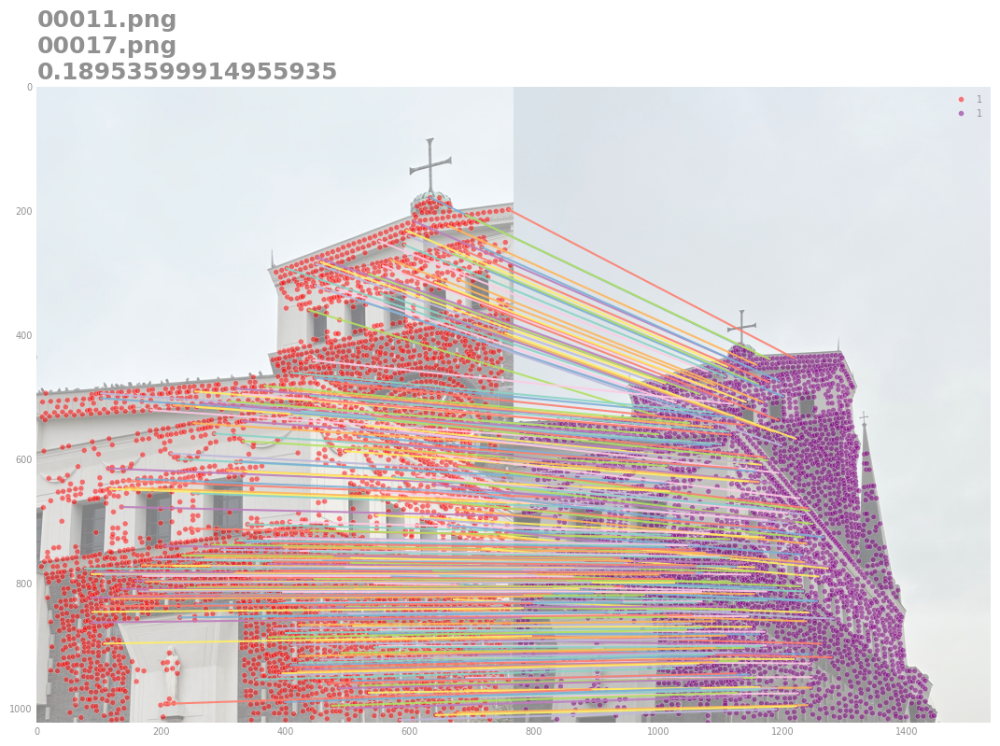

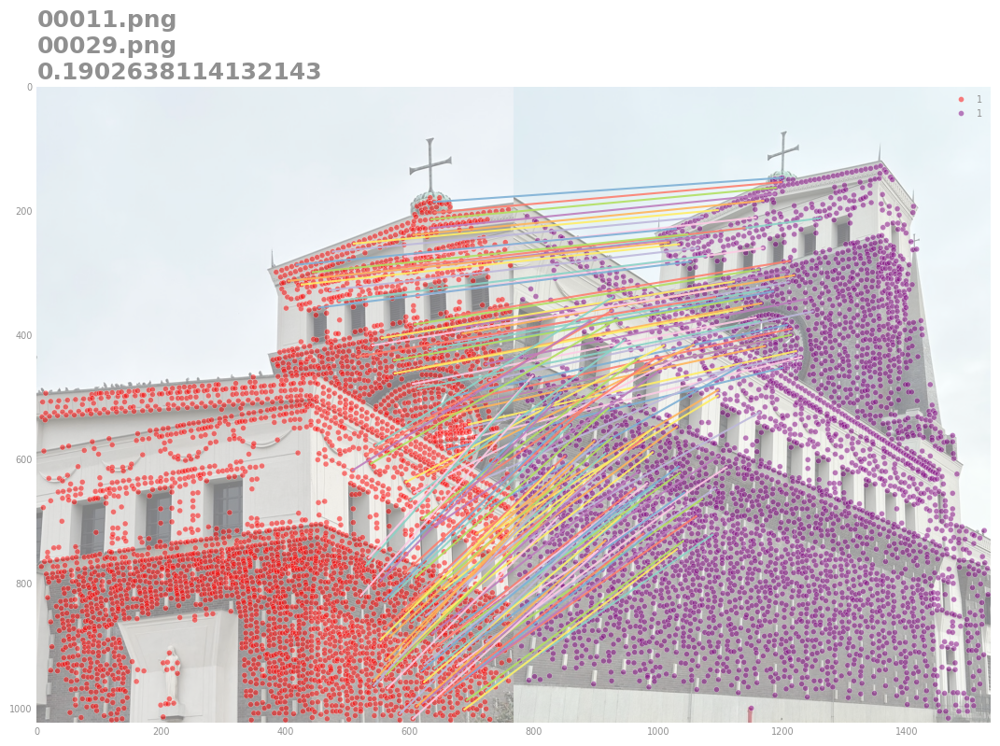

In [4]:
display_dataset_best_matched_keypoints('church', 10, 3)

 dioscuri 


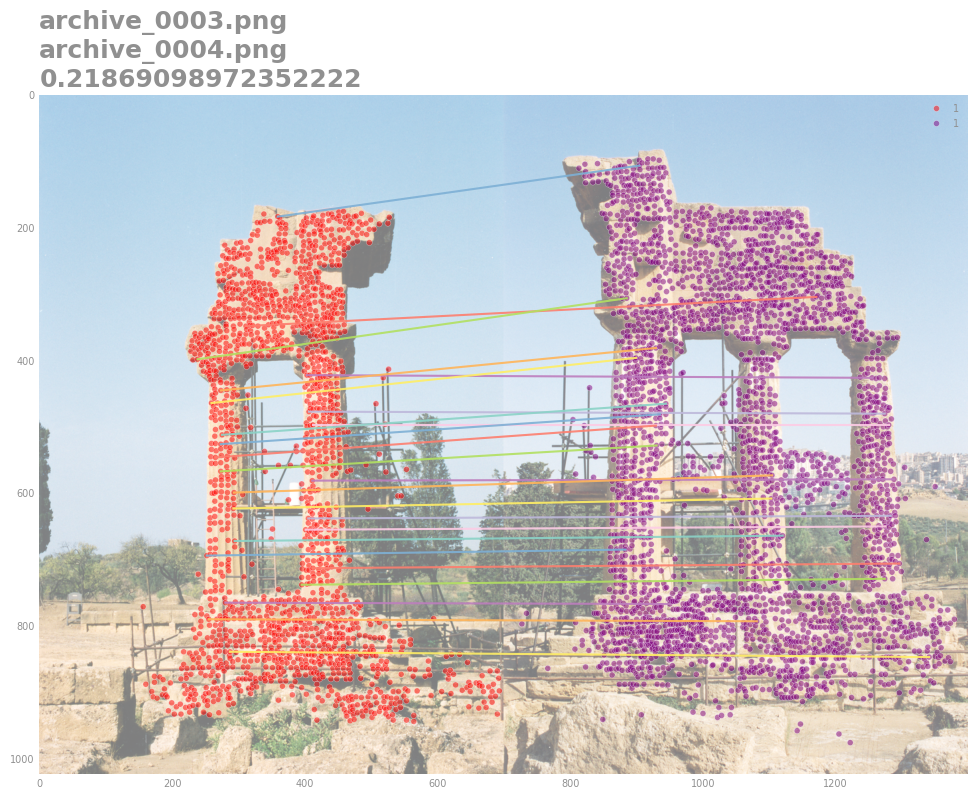

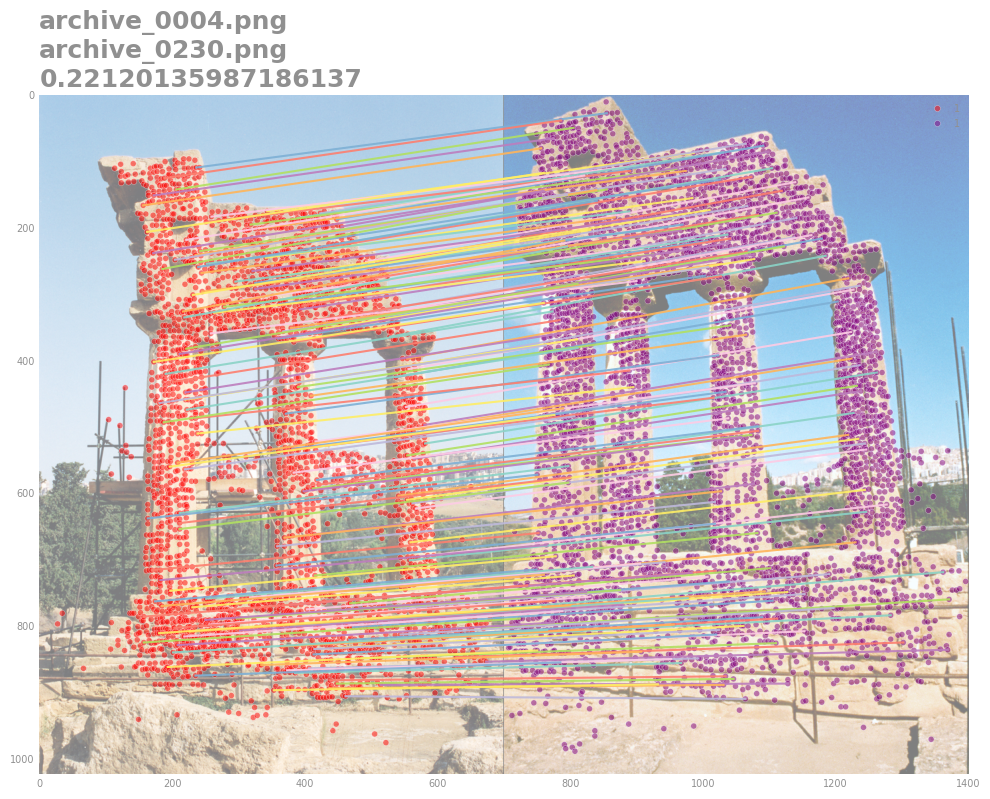

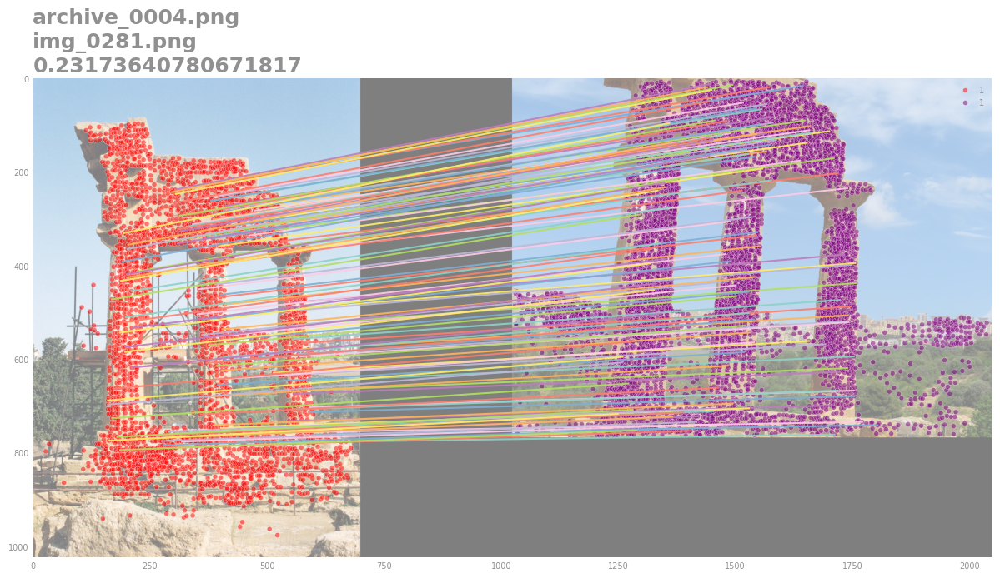

In [5]:
display_dataset_best_matched_keypoints('dioscuri', 15, 5)

 dioscuri 


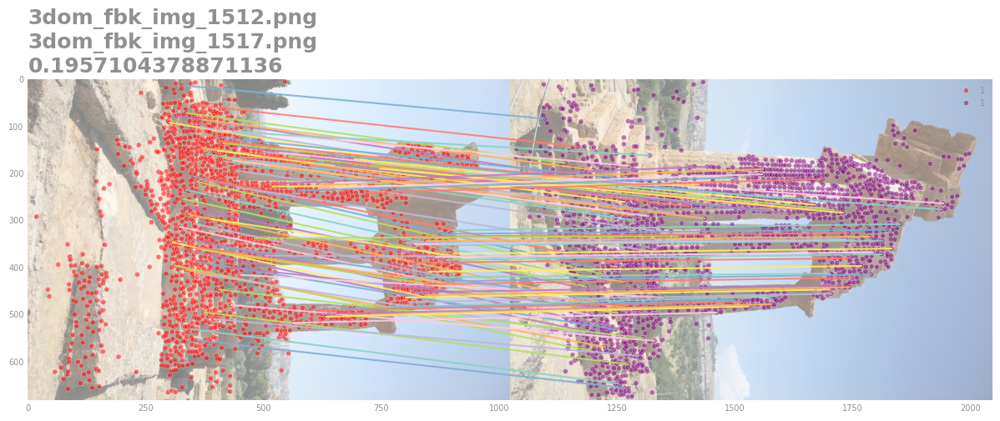

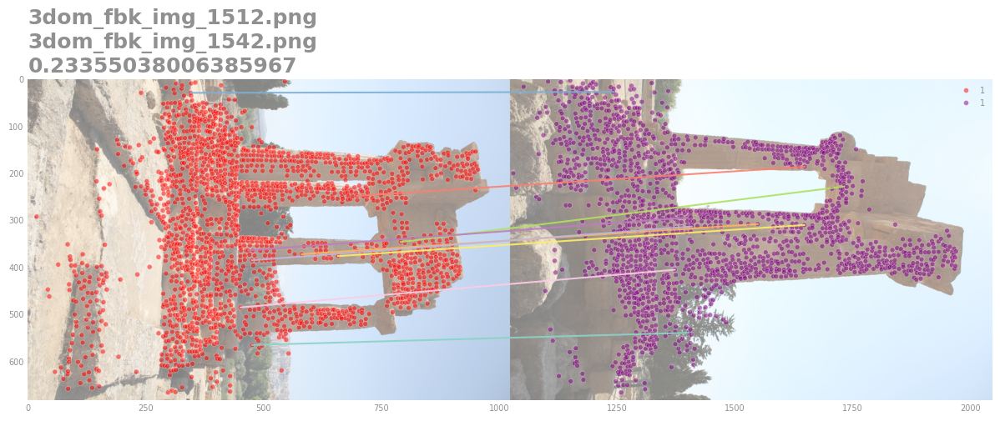

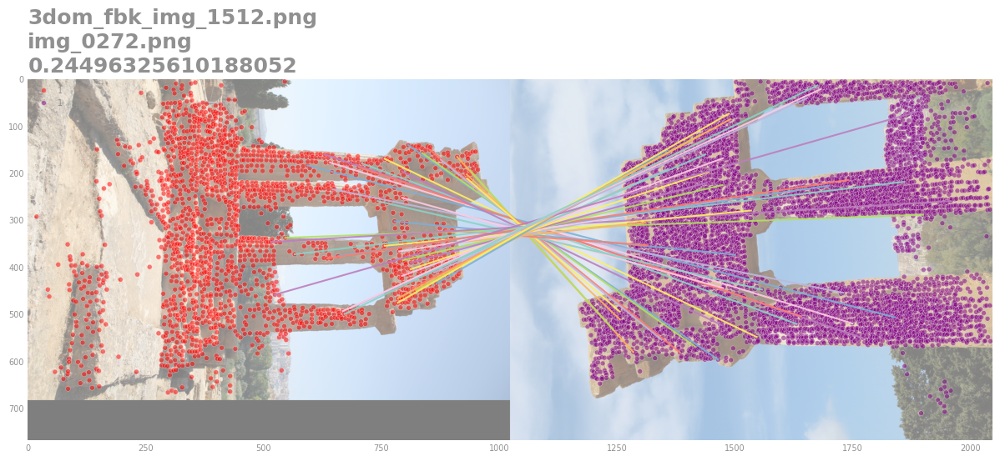

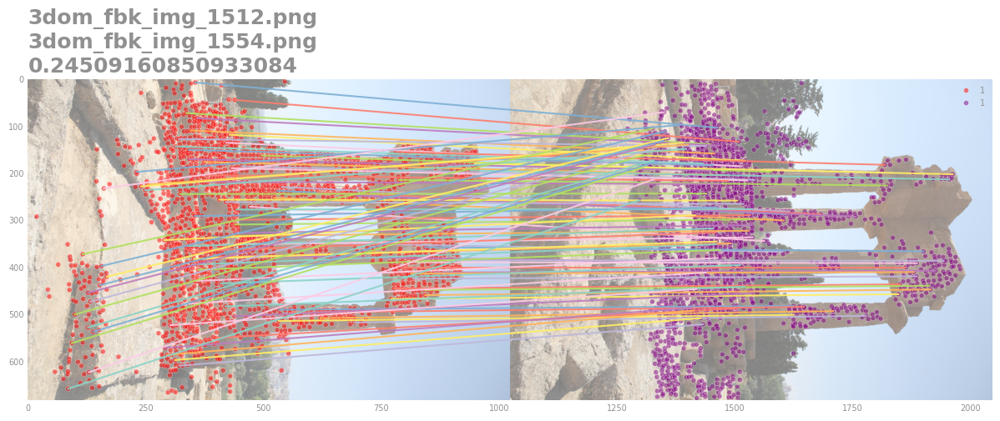

In [6]:
display_dataset_best_matched_keypoints('dioscuri', 0, 5)